# **Практическая работа №8. Генеративно-состязательная сеть (GAN). Часть 1**

[**Ссылка на код с пары**](https://colab.research.google.com/drive/1i3NlGFJbY6hvm-ropSFobW9_nqUcqzPS?usp=sharing)

# Примечание:

Не забывайте периодически сохранять параметры модели. Функции для этого описаны в теоретической части. В случае приостановки процесса обучения из-за перегрузки ОЗУ, Вы сможете загрузить последние предобученные параметры и продолжить обучение.

# **Задание №1.** Обучите генератор воспризводить примитивные изображения. Датасет выберите по желанию. ([Пример](https://www.kaggle.com/datasets/sagyamthapa/handwritten-math-symbols))

In [21]:
from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
from keras.models import Sequential, Model
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np

In [22]:
img_rows = 48
img_cols = 64
channels = 1
img_shape = (img_rows, img_cols, channels)

Генератор

In [23]:
def build_generator():
    noise_shape = (100,)

    model = Sequential()

    model.add(Dense(256, input_shape=noise_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(1024))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    
    model.add(Dense(np.prod(img_shape), activation='tanh'))
    model.add(Reshape(img_shape))

    model.summary()

    noise = Input(shape=noise_shape)
    img = model(noise)    # Генерация изображения

    return Model(noise, img)

Дискриминатор

In [24]:
def build_discriminator():


    model = Sequential()

    model.add(Flatten(input_shape=img_shape))
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(1, activation='sigmoid'))
    model.summary()

    img = Input(shape=img_shape)
    validity = model(img)

    return Model(img, validity)

In [25]:
from tensorflow.keras.models import load_model, save_model
import os

models_path = r'.\models\latin'
gan_path = os.path.join(models_path, "gan")
generator_path = os.path.join(models_path, "generator")
discriminator_path = os.path.join(models_path, "discriminator")

def save(gan, generator, discriminator):
    discriminator.trainable = False
    save_model(gan, gan_path)
    discriminator.trainable = True
    save_model(generator, generator_path)
    save_model(discriminator, discriminator_path)

def load():
    discriminator = load_model(discriminator_path)
    generator = load_model(generator_path)
    gan = load_model(gan_path)
    gan.summary()
    discriminator.summary()
    generator.summary()

    return gan, generator, discriminator

In [26]:
from sklearn.model_selection import train_test_split
from imutils import paths
import random 
import cv2

def load_data():
    imagePaths = sorted(list(paths.list_images(r"./data/latin/")))
    random.shuffle(imagePaths)
    allX = []
    for imagePath in imagePaths:
        image = cv2.imread(imagePath, cv2.IMREAD_GRAYSCALE)
        image = cv2.resize(image, (img_cols, img_rows))
        allX.append(image)

    allX = np.array(allX)
    return (allX, None), (None, None)

Инициализируем модели

In [27]:
optimizer = Adam(0.0005, 0.5) 

In [28]:
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 3072)              0         
                                                                 
 dense_7 (Dense)             (None, 512)               1573376   
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 512)               0         
                                                                 
 dense_8 (Dense)             (None, 256)               131328    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_9 (Dense)             (None, 1)                 257       
                                                                 
Total params: 1,704,961
Trainable params: 1,704,961
No

In [29]:
generator = build_generator()
generator.compile(loss='binary_crossentropy', optimizer=optimizer)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 256)               25856     
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 256)               0         
                                                                 
 batch_normalization_3 (Batc  (None, 256)              1024      
 hNormalization)                                                 
                                                                 
 dense_11 (Dense)            (None, 512)               131584    
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 512)               0         
                                                                 
 batch_normalization_4 (Batc  (None, 512)              2048      
 hNormalization)                                      

In [30]:
z = Input(shape=(100,))
img = generator(z)

In [31]:
discriminator.trainable = False

In [32]:
valid = discriminator(img)

In [33]:
combined = Model(z, valid)
combined.compile(loss='binary_crossentropy', optimizer=optimizer)

In [34]:
def save_imgs(epoch):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = generator.predict(noise)

    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(os.path.join(r".\train_images\latin", "generated_epoch_%d.png" % epoch) )
    plt.close()

Обучение

In [35]:
def train(epochs, batch_size=128, save_interval=50):

    (X_train, _), (_, _) = load_data()

    X_train = (X_train.astype(np.float32) - 127.5) / 127.5

    X_train = np.expand_dims(X_train, axis=3) 
    half_batch = int(batch_size / 2)


    for epoch in range(epochs):

        idx = np.random.randint(0, X_train.shape[0], half_batch)
        imgs = X_train[idx]

 
        noise = np.random.normal(0, 1, (half_batch, 100))

        gen_imgs = generator.predict(noise)

        d_loss_real = discriminator.train_on_batch(imgs, np.ones((half_batch, 1))) 
        d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)))

        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake) 


        noise = np.random.normal(0, 1, (batch_size, 100)) 

        valid_y = np.array([1] * batch_size)

        g_loss = combined.train_on_batch(noise, valid_y)

        
        print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

        if epoch % save_interval == 0:
            save_imgs(epoch)
            if epoch % 1000 == 0:
                save(combined, generator, discriminator)



In [36]:
train(epochs=50000, batch_size=32, save_interval=2000)

generator.save(os.path.join(r'.\models', 'latin_generator_model_final_1.h5')) 

1/1 [==============================] - 0s 101ms/step
0 [D loss: 0.661569, acc.: 78.12%] [G loss: 0.818734]
1/1 [==============================] - 0s 23ms/step
INFO:tensorflow:Assets written to: .\models\latin\gan\assets
INFO:tensorflow:Assets written to: .\models\latin\generator\assets
INFO:tensorflow:Assets written to: .\models\latin\discriminator\assets
1/1 [==============================] - 0s 24ms/step
1 [D loss: 0.310933, acc.: 90.62%] [G loss: 0.788791]
1/1 [==============================] - 0s 25ms/step
2 [D loss: 0.301095, acc.: 90.62%] [G loss: 0.842410]
1/1 [==============================] - 0s 21ms/step
3 [D loss: 0.312317, acc.: 81.25%] [G loss: 0.996510]
1/1 [==============================] - 0s 22ms/step
4 [D loss: 0.370471, acc.: 71.88%] [G loss: 1.100760]
1/1 [==============================] - 0s 22ms/step
5 [D loss: 0.261178, acc.: 90.62%] [G loss: 1.420615]
1/1 [==============================] - 0s 25ms/step
6 [D loss: 0.141427, acc.: 96.88%] [G loss: 1.698310]
1/1 [=

### Демонстрация сгенерированных изображений:

1/1 [==============================] - 0s 312ms/step


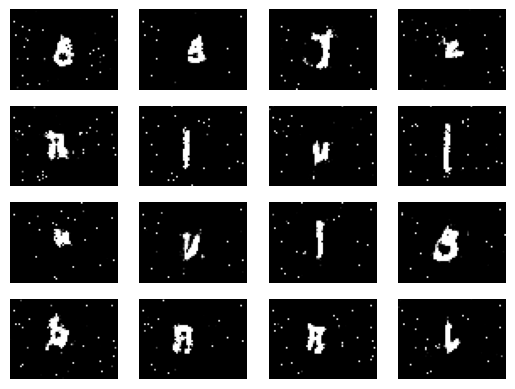

In [38]:
from keras.models import load_model
from numpy.random import randn
from matplotlib import pyplot as plt

def generate_latent_points(latent_dim, n_samples):
	x_input = randn(latent_dim * n_samples)
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input

def save_plot(examples, n):
	# plot images
	for i in range(n * n):
		plt.subplot(n, n, 1 + i)
		plt.axis('off')
		plt.imshow(examples[i, :, :, 0], cmap='gray_r')
	plt.show()

model = load_model(os.path.join(r'.\models', 'latin_generator_model_final_1.h5'))

latent_points = generate_latent_points(100, 16) 

X = model.predict(latent_points)

save_plot(X, 4)

# **Задание №2.** Обучите генератор воспризводить сложные изображения. Датасет выберите по желанию. ([Пример](https://www.kaggle.com/datasets/fedesoriano/cifar100))

In [3]:
from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten
from keras.layers import BatchNormalization, UpSampling2D, Activation
from keras.layers import LeakyReLU, Conv2D, ZeroPadding2D, Dropout, Conv2DTranspose
from keras.models import Sequential, Model
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np

In [4]:
img_rows = 32
img_cols = 32
channels = 3
img_shape = (img_rows, img_cols, channels)

In [39]:
def build_generator():
    noise_shape = (100,)

    model = Sequential()

    model.add(Dense(8 * 8 * 512, input_shape =noise_shape)),
    model.add(Reshape([8, 8, 512])),
    model.add(BatchNormalization()),
    model.add(Conv2DTranspose(
        128, (5, 5), (2, 2), padding ="same", activation ="selu")),
    model.add(BatchNormalization()),
    model.add(Conv2DTranspose(
        32, (5, 5), (2, 2), padding ="same", activation ="selu")),
    model.add(BatchNormalization()),
    model.add(Conv2D(
        3, (5, 5), (1, 1), padding ="same", activation ="tanh")),
    

    model.summary()

    noise = Input(shape=noise_shape)
    img = model(noise)    # Генерация изображения

    return Model(noise, img)

In [40]:
def build_discriminator():


    model = Sequential()

    model.add(Conv2D(64, (5, 5), (2, 2), padding ="same", input_shape = img_shape)),
    model.add(LeakyReLU(0.2)),
    model.add(Dropout(0.3)),
    model.add(Conv2D(128, (5, 5), (2, 2), padding ="same")),
    model.add(LeakyReLU(0.2)),
    model.add(Dropout(0.3)),
    model.add(Flatten()),
    model.add(Dense(1, activation='sigmoid'))
    model.summary()

    img = Input(shape=img_shape)
    validity = model(img)

    return Model(img, validity)

In [41]:
from sklearn.model_selection import train_test_split
from imutils import paths
import random 
import cv2
import os
import numpy as np
import h5py

def load_data():
    h5file = h5py.File(os.path.join(r".\data\food", 'food_c101_n10099_r32x32x3.h5'), 'r')
    images = np.array(h5file["images"]).astype("uint8")

    return (images, None), (None, None)


def show_images(n):
	(x, _), (_, _) = load_data()
	for i in range(n * n):
		plt.subplot(n, n, 1 + i)
		plt.axis('off')
		plt.imshow(x[i])
	plt.show()

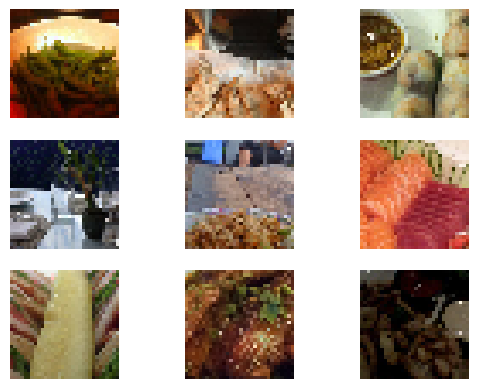

In [42]:
show_images(3)

In [43]:
from tensorflow.keras.models import load_model, save_model
import os

models_path = r'.\models\food'
gan_path = os.path.join(models_path, "gan")
generator_path = os.path.join(models_path, "generator")
discriminator_path = os.path.join(models_path, "discriminator")

def save(gan, generator, discriminator):
    discriminator.trainable = False
    save_model(gan, gan_path)
    discriminator.trainable = True
    save_model(generator, generator_path)
    save_model(discriminator, discriminator_path)

def load():
    discriminator = load_model(discriminator_path)
    generator = load_model(generator_path)
    gan = load_model(gan_path)
    gan.summary()
    discriminator.summary()
    generator.summary()

    return gan, generator, discriminator

In [44]:
optimizer = Adam(0.0002,0.5) 

In [45]:
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 16, 16, 64)        4864      
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 dropout_6 (Dropout)         (None, 16, 16, 64)        0         
                                                                 
 conv2d_8 (Conv2D)           (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 dropout_7 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten_3 (Flatten)         (None, 8192)             

In [46]:
generator = build_generator()
generator.compile(loss='binary_crossentropy', optimizer=optimizer)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 32768)             3309568   
                                                                 
 reshape_3 (Reshape)         (None, 8, 8, 512)         0         
                                                                 
 batch_normalization_10 (Bat  (None, 8, 8, 512)        2048      
 chNormalization)                                                
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 16, 16, 128)      1638528   
 ranspose)                                                       
                                                                 
 batch_normalization_11 (Bat  (None, 16, 16, 128)      512       
 chNormalization)                                                
                                                      

In [47]:
z = Input(shape=(100,))
img = generator(z)

In [48]:
discriminator.trainable = False

In [49]:
valid = discriminator(img)

In [50]:
combined = Model(z, valid)
combined.compile(loss='binary_crossentropy', optimizer=optimizer)

In [51]:
def save_imgs(epoch):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = generator.predict(noise)

    gen_imgs = gen_imgs*127 + 127
    gen_imgs = gen_imgs.astype("uint8")

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt], cmap='gray')
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig(os.path.join(r".\train_images\food", "generated_epoch_%d.png" % epoch) )
    plt.close()

In [52]:
def train(epochs, batch_size=128, save_interval=50):

    (X_train, _), (_, _) = load_data()

    X_train = (X_train.astype(np.float32) - 127.5) / 127.5

    half_batch = int(batch_size / 2)


    for epoch in range(epochs):

        idx = np.random.randint(0, X_train.shape[0], half_batch)
        imgs = X_train[idx]

 
        noise = np.random.normal(0, 1, (half_batch, 100))

        gen_imgs = generator.predict(noise)

        d_loss_real = discriminator.train_on_batch(imgs, np.ones((half_batch, 1))) 
        d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)))

        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake) 


        noise = np.random.normal(0, 1, (batch_size, 100)) 

        valid_y = np.array([1] * batch_size)

        g_loss = combined.train_on_batch(noise, valid_y)

        
        print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

        if epoch % save_interval == 0:
            save_imgs(epoch)
            if epoch % 1000 == 0:
                save(combined, generator, discriminator)

In [53]:
import tensorflow as tf
tf.config.run_functions_eagerly(True) 

In [54]:
train(epochs=50000, batch_size=32, save_interval=1000)

generator.save(os.path.join(r'.\models', 'food_generator_model_final.h5')) 

c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 5s 5s/step
0 [D loss: 0.712821, acc.: 21.88%] [G loss: 0.637105]
1/1 [==============================] - 0s 218ms/step


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets
c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 21ms/step
1 [D loss: 0.665396, acc.: 46.88%] [G loss: 0.577314]
1/1 [==============================] - 0s 19ms/step
2 [D loss: 0.626602, acc.: 50.00%] [G loss: 0.492544]
1/1 [==============================] - 0s 22ms/step
3 [D loss: 0.564296, acc.: 50.00%] [G loss: 0.400106]
1/1 [==============================] - 0s 22ms/step
4 [D loss: 0.530890, acc.: 50.00%] [G loss: 0.353191]
1/1 [==============================] - 0s 20ms/step
5 [D loss: 0.509840, acc.: 56.25%] [G loss: 0.313101]
1/1 [==============================] - 0s 20ms/step
6 [D loss: 0.473971, acc.: 50.00%] [G loss: 0.258654]
1/1 [==============================] - 0s 21ms/step
7 [D loss: 0.469043, acc.: 50.00%] [G loss: 0.244767]
1/1 [==============================] - 0s 20ms/step
8 [D loss: 0.447159, acc.: 50.00%] [G loss: 0.270185]
1/1 [==============================] - 0s 19ms/step
9 [D loss: 0.432599, acc.: 50.00%] [G loss: 0.220506]
1/1 [==============================] - 0s 20ms

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 21ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1001 [D loss: 0.705202, acc.: 15.62%] [G loss: 0.695586]
1/1 [==============================] - 0s 20ms/step
1002 [D loss: 0.706795, acc.: 18.75%] [G loss: 0.690874]
1/1 [==============================] - 0s 20ms/step
1003 [D loss: 0.703604, acc.: 34.38%] [G loss: 0.686584]
1/1 [==============================] - 0s 19ms/step
1004 [D loss: 0.704692, acc.: 25.00%] [G loss: 0.686146]
1/1 [==============================] - 0s 20ms/step
1005 [D loss: 0.706011, acc.: 28.12%] [G loss: 0.691073]
1/1 [==============================] - 0s 21ms/step
1006 [D loss: 0.701634, acc.: 31.25%] [G loss: 0.693082]
1/1 [==============================] - 0s 19ms/step
1007 [D loss: 0.697525, acc.: 31.25%] [G loss: 0.694018]
1/1 [==============================] - 0s 24ms/step
1008 [D loss: 0.699680, acc.: 28.12%] [G loss: 0.697202]
1/1 [==============================] - 0s 17ms/step
1009 [D loss: 0.701168, acc.: 31.25%] [G loss: 0.696556]
1/1 [==============================] - 0s 18ms/step
1010 [D loss: 0.701

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 43ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


2001 [D loss: 0.707161, acc.: 43.75%] [G loss: 0.683804]
1/1 [==============================] - 0s 48ms/step
2002 [D loss: 0.712592, acc.: 18.75%] [G loss: 0.689294]
1/1 [==============================] - 0s 42ms/step
2003 [D loss: 0.692584, acc.: 53.12%] [G loss: 0.690215]
1/1 [==============================] - 0s 39ms/step
2004 [D loss: 0.699441, acc.: 40.62%] [G loss: 0.690239]
1/1 [==============================] - 0s 46ms/step
2005 [D loss: 0.698690, acc.: 37.50%] [G loss: 0.689210]
1/1 [==============================] - 0s 43ms/step
2006 [D loss: 0.699390, acc.: 34.38%] [G loss: 0.701173]
1/1 [==============================] - 0s 45ms/step
2007 [D loss: 0.696422, acc.: 46.88%] [G loss: 0.703982]
1/1 [==============================] - 0s 52ms/step
2008 [D loss: 0.688761, acc.: 56.25%] [G loss: 0.705577]
1/1 [==============================] - 0s 37ms/step
2009 [D loss: 0.689777, acc.: 53.12%] [G loss: 0.714304]
1/1 [==============================] - 0s 51ms/step
2010 [D loss: 0.691

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets
c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 20ms/step
3001 [D loss: 0.586611, acc.: 65.62%] [G loss: 0.752561]
1/1 [==============================] - 0s 19ms/step
3002 [D loss: 0.527674, acc.: 78.12%] [G loss: 1.325660]
1/1 [==============================] - 0s 20ms/step
3003 [D loss: 0.715334, acc.: 50.00%] [G loss: 1.217057]
1/1 [==============================] - 0s 20ms/step
3004 [D loss: 0.544978, acc.: 71.88%] [G loss: 0.965372]
1/1 [==============================] - 0s 21ms/step
3005 [D loss: 0.585637, acc.: 59.38%] [G loss: 1.297237]
1/1 [==============================] - 0s 19ms/step
3006 [D loss: 0.583028, acc.: 75.00%] [G loss: 0.953092]
1/1 [==============================] - 0s 17ms/step
3007 [D loss: 0.673783, acc.: 50.00%] [G loss: 0.967058]
1/1 [==============================] - 0s 19ms/step
3008 [D loss: 0.497507, acc.: 84.38%] [G loss: 0.999253]
1/1 [==============================] - 0s 18ms/step
3009 [D loss: 0.667716, acc.: 68.75%] [G loss: 0.906189]
1/1 [==============

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 21ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


4001 [D loss: 0.697261, acc.: 43.75%] [G loss: 0.710851]
1/1 [==============================] - 0s 22ms/step
4002 [D loss: 0.690848, acc.: 59.38%] [G loss: 0.693980]
1/1 [==============================] - 0s 22ms/step
4003 [D loss: 0.701300, acc.: 50.00%] [G loss: 0.672066]
1/1 [==============================] - 0s 20ms/step
4004 [D loss: 0.698518, acc.: 46.88%] [G loss: 0.677278]
1/1 [==============================] - 0s 21ms/step
4005 [D loss: 0.707991, acc.: 43.75%] [G loss: 0.689576]
1/1 [==============================] - 0s 22ms/step
4006 [D loss: 0.707124, acc.: 40.62%] [G loss: 0.687179]
1/1 [==============================] - 0s 20ms/step
4007 [D loss: 0.709970, acc.: 53.12%] [G loss: 0.707488]
1/1 [==============================] - 0s 21ms/step
4008 [D loss: 0.712483, acc.: 50.00%] [G loss: 0.711112]
1/1 [==============================] - 0s 25ms/step
4009 [D loss: 0.702444, acc.: 46.88%] [G loss: 0.711616]
1/1 [==============================] - 0s 22ms/step
4010 [D loss: 0.683

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets
c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 22ms/step
5001 [D loss: 0.705078, acc.: 40.62%] [G loss: 0.701217]
1/1 [==============================] - 0s 20ms/step
5002 [D loss: 0.703552, acc.: 31.25%] [G loss: 0.694192]
1/1 [==============================] - 0s 19ms/step
5003 [D loss: 0.698789, acc.: 43.75%] [G loss: 0.692425]
1/1 [==============================] - 0s 20ms/step
5004 [D loss: 0.695500, acc.: 46.88%] [G loss: 0.697620]
1/1 [==============================] - 0s 20ms/step
5005 [D loss: 0.691227, acc.: 53.12%] [G loss: 0.689338]
1/1 [==============================] - 0s 19ms/step
5006 [D loss: 0.701617, acc.: 34.38%] [G loss: 0.693167]
1/1 [==============================] - 0s 20ms/step
5007 [D loss: 0.701163, acc.: 43.75%] [G loss: 0.696427]
1/1 [==============================] - 0s 19ms/step
5008 [D loss: 0.706858, acc.: 34.38%] [G loss: 0.687666]
1/1 [==============================] - 0s 20ms/step
5009 [D loss: 0.706520, acc.: 40.62%] [G loss: 0.690295]
1/1 [==============

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 23ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


6001 [D loss: 0.696440, acc.: 46.88%] [G loss: 0.685825]
1/1 [==============================] - 0s 19ms/step
6002 [D loss: 0.697066, acc.: 40.62%] [G loss: 0.686462]
1/1 [==============================] - 0s 20ms/step
6003 [D loss: 0.693057, acc.: 46.88%] [G loss: 0.694270]
1/1 [==============================] - 0s 19ms/step
6004 [D loss: 0.695416, acc.: 53.12%] [G loss: 0.699726]
1/1 [==============================] - 0s 19ms/step
6005 [D loss: 0.696646, acc.: 40.62%] [G loss: 0.694515]
1/1 [==============================] - 0s 18ms/step
6006 [D loss: 0.697322, acc.: 31.25%] [G loss: 0.700043]
1/1 [==============================] - 0s 19ms/step
6007 [D loss: 0.693447, acc.: 50.00%] [G loss: 0.697270]
1/1 [==============================] - 0s 20ms/step
6008 [D loss: 0.693376, acc.: 56.25%] [G loss: 0.701002]
1/1 [==============================] - 0s 19ms/step
6009 [D loss: 0.696649, acc.: 40.62%] [G loss: 0.696772]
1/1 [==============================] - 0s 19ms/step
6010 [D loss: 0.693

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets
c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 20ms/step
7001 [D loss: 0.699477, acc.: 34.38%] [G loss: 0.696010]
1/1 [==============================] - 0s 20ms/step
7002 [D loss: 0.696095, acc.: 46.88%] [G loss: 0.697071]
1/1 [==============================] - 0s 20ms/step
7003 [D loss: 0.702192, acc.: 34.38%] [G loss: 0.695857]
1/1 [==============================] - 0s 19ms/step
7004 [D loss: 0.701158, acc.: 28.12%] [G loss: 0.691387]
1/1 [==============================] - 0s 19ms/step
7005 [D loss: 0.693266, acc.: 43.75%] [G loss: 0.696280]
1/1 [==============================] - 0s 20ms/step
7006 [D loss: 0.698220, acc.: 34.38%] [G loss: 0.690502]
1/1 [==============================] - 0s 20ms/step
7007 [D loss: 0.697765, acc.: 25.00%] [G loss: 0.697101]
1/1 [==============================] - 0s 19ms/step
7008 [D loss: 0.694750, acc.: 43.75%] [G loss: 0.696333]
1/1 [==============================] - 0s 17ms/step
7009 [D loss: 0.696209, acc.: 40.62%] [G loss: 0.696607]
1/1 [==============

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 21ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


8001 [D loss: 0.696112, acc.: 37.50%] [G loss: 0.693385]
1/1 [==============================] - 0s 20ms/step
8002 [D loss: 0.696643, acc.: 40.62%] [G loss: 0.698053]
1/1 [==============================] - 0s 19ms/step
8003 [D loss: 0.696373, acc.: 40.62%] [G loss: 0.691157]
1/1 [==============================] - 0s 20ms/step
8004 [D loss: 0.698602, acc.: 28.12%] [G loss: 0.694797]
1/1 [==============================] - 0s 18ms/step
8005 [D loss: 0.693132, acc.: 53.12%] [G loss: 0.693257]
1/1 [==============================] - 0s 20ms/step
8006 [D loss: 0.697383, acc.: 37.50%] [G loss: 0.694051]
1/1 [==============================] - 0s 19ms/step
8007 [D loss: 0.694211, acc.: 37.50%] [G loss: 0.695360]
1/1 [==============================] - 0s 20ms/step
8008 [D loss: 0.695348, acc.: 50.00%] [G loss: 0.693466]
1/1 [==============================] - 0s 19ms/step
8009 [D loss: 0.699135, acc.: 37.50%] [G loss: 0.693285]
1/1 [==============================] - 0s 19ms/step
8010 [D loss: 0.698

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets
c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 21ms/step
9001 [D loss: 0.693901, acc.: 46.88%] [G loss: 0.700501]
1/1 [==============================] - 0s 20ms/step
9002 [D loss: 0.694057, acc.: 37.50%] [G loss: 0.700449]
1/1 [==============================] - 0s 20ms/step
9003 [D loss: 0.695667, acc.: 43.75%] [G loss: 0.699088]
1/1 [==============================] - 0s 20ms/step
9004 [D loss: 0.692507, acc.: 46.88%] [G loss: 0.699217]
1/1 [==============================] - 0s 23ms/step
9005 [D loss: 0.698144, acc.: 28.12%] [G loss: 0.702695]
1/1 [==============================] - 0s 20ms/step
9006 [D loss: 0.695054, acc.: 40.62%] [G loss: 0.701063]
1/1 [==============================] - 0s 20ms/step
9007 [D loss: 0.693008, acc.: 34.38%] [G loss: 0.700479]
1/1 [==============================] - 0s 20ms/step
9008 [D loss: 0.691353, acc.: 50.00%] [G loss: 0.698026]
1/1 [==============================] - 0s 20ms/step
9009 [D loss: 0.694147, acc.: 50.00%] [G loss: 0.698269]
1/1 [==============

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets
c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 20ms/step
10001 [D loss: 0.698536, acc.: 43.75%] [G loss: 0.697546]
1/1 [==============================] - 0s 19ms/step
10002 [D loss: 0.697755, acc.: 34.38%] [G loss: 0.701156]
1/1 [==============================] - 0s 19ms/step
10003 [D loss: 0.693941, acc.: 53.12%] [G loss: 0.704639]
1/1 [==============================] - 0s 20ms/step
10004 [D loss: 0.697286, acc.: 31.25%] [G loss: 0.701381]
1/1 [==============================] - 0s 21ms/step
10005 [D loss: 0.693646, acc.: 56.25%] [G loss: 0.702412]
1/1 [==============================] - 0s 19ms/step
10006 [D loss: 0.690986, acc.: 56.25%] [G loss: 0.703630]
1/1 [==============================] - 0s 21ms/step
10007 [D loss: 0.693014, acc.: 50.00%] [G loss: 0.698855]
1/1 [==============================] - 0s 22ms/step
10008 [D loss: 0.695318, acc.: 43.75%] [G loss: 0.702291]
1/1 [==============================] - 0s 19ms/step
10009 [D loss: 0.695997, acc.: 37.50%] [G loss: 0.705106]
1/1 [=====

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 22ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


11001 [D loss: 0.695710, acc.: 46.88%] [G loss: 0.696278]
1/1 [==============================] - 0s 21ms/step
11002 [D loss: 0.697320, acc.: 43.75%] [G loss: 0.698233]
1/1 [==============================] - 0s 21ms/step
11003 [D loss: 0.694607, acc.: 37.50%] [G loss: 0.698241]
1/1 [==============================] - 0s 21ms/step
11004 [D loss: 0.695217, acc.: 43.75%] [G loss: 0.696320]
1/1 [==============================] - 0s 21ms/step
11005 [D loss: 0.691945, acc.: 53.12%] [G loss: 0.695275]
1/1 [==============================] - 0s 21ms/step
11006 [D loss: 0.694616, acc.: 40.62%] [G loss: 0.692832]
1/1 [==============================] - 0s 19ms/step
11007 [D loss: 0.694394, acc.: 40.62%] [G loss: 0.694153]
1/1 [==============================] - 0s 19ms/step
11008 [D loss: 0.693476, acc.: 50.00%] [G loss: 0.696921]
1/1 [==============================] - 0s 19ms/step
11009 [D loss: 0.694555, acc.: 53.12%] [G loss: 0.698272]
1/1 [==============================] - 0s 19ms/step
11010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets
c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 23ms/step
12001 [D loss: 0.695267, acc.: 50.00%] [G loss: 0.701108]
1/1 [==============================] - 0s 18ms/step
12002 [D loss: 0.697441, acc.: 28.12%] [G loss: 0.698810]
1/1 [==============================] - 0s 19ms/step
12003 [D loss: 0.693749, acc.: 50.00%] [G loss: 0.700885]
1/1 [==============================] - 0s 19ms/step
12004 [D loss: 0.696513, acc.: 40.62%] [G loss: 0.699259]
1/1 [==============================] - 0s 18ms/step
12005 [D loss: 0.696005, acc.: 37.50%] [G loss: 0.699370]
1/1 [==============================] - 0s 22ms/step
12006 [D loss: 0.695828, acc.: 40.62%] [G loss: 0.697009]
1/1 [==============================] - 0s 19ms/step
12007 [D loss: 0.692344, acc.: 46.88%] [G loss: 0.693188]
1/1 [==============================] - 0s 20ms/step
12008 [D loss: 0.694789, acc.: 46.88%] [G loss: 0.696620]
1/1 [==============================] - 0s 20ms/step
12009 [D loss: 0.695957, acc.: 37.50%] [G loss: 0.697087]
1/1 [=====

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 22ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


13001 [D loss: 0.697881, acc.: 43.75%] [G loss: 0.705495]
1/1 [==============================] - 0s 19ms/step
13002 [D loss: 0.694233, acc.: 40.62%] [G loss: 0.700955]
1/1 [==============================] - 0s 18ms/step
13003 [D loss: 0.696278, acc.: 28.12%] [G loss: 0.703882]
1/1 [==============================] - 0s 19ms/step
13004 [D loss: 0.697301, acc.: 40.62%] [G loss: 0.708534]
1/1 [==============================] - 0s 18ms/step
13005 [D loss: 0.689033, acc.: 50.00%] [G loss: 0.708240]
1/1 [==============================] - 0s 18ms/step
13006 [D loss: 0.691768, acc.: 43.75%] [G loss: 0.710863]
1/1 [==============================] - 0s 21ms/step
13007 [D loss: 0.710616, acc.: 34.38%] [G loss: 0.706796]
1/1 [==============================] - 0s 20ms/step
13008 [D loss: 0.692401, acc.: 50.00%] [G loss: 0.703316]
1/1 [==============================] - 0s 18ms/step
13009 [D loss: 0.691592, acc.: 59.38%] [G loss: 0.703704]
1/1 [==============================] - 0s 19ms/step
13010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 22ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


14001 [D loss: 0.690289, acc.: 65.62%] [G loss: 0.696913]
1/1 [==============================] - 0s 19ms/step
14002 [D loss: 0.696472, acc.: 50.00%] [G loss: 0.699093]
1/1 [==============================] - 0s 20ms/step
14003 [D loss: 0.691835, acc.: 59.38%] [G loss: 0.696430]
1/1 [==============================] - 0s 20ms/step
14004 [D loss: 0.696671, acc.: 43.75%] [G loss: 0.694884]
1/1 [==============================] - 0s 20ms/step
14005 [D loss: 0.693522, acc.: 43.75%] [G loss: 0.698442]
1/1 [==============================] - 0s 19ms/step
14006 [D loss: 0.692980, acc.: 53.12%] [G loss: 0.692059]
1/1 [==============================] - 0s 20ms/step
14007 [D loss: 0.696527, acc.: 37.50%] [G loss: 0.694070]
1/1 [==============================] - 0s 21ms/step
14008 [D loss: 0.700635, acc.: 18.75%] [G loss: 0.694129]
1/1 [==============================] - 0s 21ms/step
14009 [D loss: 0.695165, acc.: 40.62%] [G loss: 0.691800]
1/1 [==============================] - 0s 20ms/step
14010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 24ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


15001 [D loss: 0.696908, acc.: 34.38%] [G loss: 0.692749]
1/1 [==============================] - 0s 21ms/step
15002 [D loss: 0.696199, acc.: 46.88%] [G loss: 0.696323]
1/1 [==============================] - 0s 22ms/step
15003 [D loss: 0.693517, acc.: 40.62%] [G loss: 0.693897]
1/1 [==============================] - 0s 20ms/step
15004 [D loss: 0.695508, acc.: 37.50%] [G loss: 0.692592]
1/1 [==============================] - 0s 21ms/step
15005 [D loss: 0.695120, acc.: 43.75%] [G loss: 0.695706]
1/1 [==============================] - 0s 22ms/step
15006 [D loss: 0.693082, acc.: 50.00%] [G loss: 0.694208]
1/1 [==============================] - 0s 20ms/step
15007 [D loss: 0.694077, acc.: 53.12%] [G loss: 0.697648]
1/1 [==============================] - 0s 20ms/step
15008 [D loss: 0.695107, acc.: 34.38%] [G loss: 0.694711]
1/1 [==============================] - 0s 18ms/step
15009 [D loss: 0.696008, acc.: 37.50%] [G loss: 0.694068]
1/1 [==============================] - 0s 21ms/step
15010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 20ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


16001 [D loss: 0.695543, acc.: 31.25%] [G loss: 0.699737]
1/1 [==============================] - 0s 22ms/step
16002 [D loss: 0.694653, acc.: 40.62%] [G loss: 0.698846]
1/1 [==============================] - 0s 20ms/step
16003 [D loss: 0.692929, acc.: 59.38%] [G loss: 0.696514]
1/1 [==============================] - 0s 21ms/step
16004 [D loss: 0.697111, acc.: 25.00%] [G loss: 0.697016]
1/1 [==============================] - 0s 18ms/step
16005 [D loss: 0.694219, acc.: 50.00%] [G loss: 0.696880]
1/1 [==============================] - 0s 20ms/step
16006 [D loss: 0.697580, acc.: 40.62%] [G loss: 0.697278]
1/1 [==============================] - 0s 23ms/step
16007 [D loss: 0.695235, acc.: 40.62%] [G loss: 0.696421]
1/1 [==============================] - 0s 18ms/step
16008 [D loss: 0.697245, acc.: 40.62%] [G loss: 0.694746]
1/1 [==============================] - 0s 20ms/step
16009 [D loss: 0.696113, acc.: 40.62%] [G loss: 0.695526]
1/1 [==============================] - 0s 19ms/step
16010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 22ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


17001 [D loss: 0.694765, acc.: 37.50%] [G loss: 0.695339]
1/1 [==============================] - 0s 20ms/step
17002 [D loss: 0.695354, acc.: 34.38%] [G loss: 0.694872]
1/1 [==============================] - 0s 20ms/step
17003 [D loss: 0.695148, acc.: 28.12%] [G loss: 0.696792]
1/1 [==============================] - 0s 22ms/step
17004 [D loss: 0.695354, acc.: 34.38%] [G loss: 0.695359]
1/1 [==============================] - 0s 20ms/step
17005 [D loss: 0.695357, acc.: 43.75%] [G loss: 0.694988]
1/1 [==============================] - 0s 21ms/step
17006 [D loss: 0.695487, acc.: 31.25%] [G loss: 0.694217]
1/1 [==============================] - 0s 24ms/step
17007 [D loss: 0.694741, acc.: 37.50%] [G loss: 0.694880]
1/1 [==============================] - 0s 18ms/step
17008 [D loss: 0.694647, acc.: 34.38%] [G loss: 0.694617]
1/1 [==============================] - 0s 20ms/step
17009 [D loss: 0.694865, acc.: 43.75%] [G loss: 0.694005]
1/1 [==============================] - 0s 19ms/step
17010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 24ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


18001 [D loss: 0.691687, acc.: 43.75%] [G loss: 0.692756]
1/1 [==============================] - 0s 21ms/step
18002 [D loss: 0.695928, acc.: 50.00%] [G loss: 0.693723]
1/1 [==============================] - 0s 19ms/step
18003 [D loss: 0.701554, acc.: 37.50%] [G loss: 0.688090]
1/1 [==============================] - 0s 20ms/step
18004 [D loss: 0.696479, acc.: 43.75%] [G loss: 0.697979]
1/1 [==============================] - 0s 20ms/step
18005 [D loss: 0.696545, acc.: 43.75%] [G loss: 0.687676]
1/1 [==============================] - 0s 19ms/step
18006 [D loss: 0.694303, acc.: 37.50%] [G loss: 0.679750]
1/1 [==============================] - 0s 19ms/step
18007 [D loss: 0.699618, acc.: 25.00%] [G loss: 0.687971]
1/1 [==============================] - 0s 20ms/step
18008 [D loss: 0.697669, acc.: 31.25%] [G loss: 0.690890]
1/1 [==============================] - 0s 19ms/step
18009 [D loss: 0.696259, acc.: 40.62%] [G loss: 0.688362]
1/1 [==============================] - 0s 20ms/step
18010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 24ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


19001 [D loss: 0.699060, acc.: 53.12%] [G loss: 0.677123]
1/1 [==============================] - 0s 20ms/step
19002 [D loss: 0.688621, acc.: 59.38%] [G loss: 0.693646]
1/1 [==============================] - 0s 24ms/step
19003 [D loss: 0.690224, acc.: 59.38%] [G loss: 0.682555]
1/1 [==============================] - 0s 19ms/step
19004 [D loss: 0.702965, acc.: 46.88%] [G loss: 0.689802]
1/1 [==============================] - 0s 19ms/step
19005 [D loss: 0.702451, acc.: 46.88%] [G loss: 0.693819]
1/1 [==============================] - 0s 20ms/step
19006 [D loss: 0.687925, acc.: 56.25%] [G loss: 0.695714]
1/1 [==============================] - 0s 19ms/step
19007 [D loss: 0.702834, acc.: 28.12%] [G loss: 0.699328]
1/1 [==============================] - 0s 19ms/step
19008 [D loss: 0.695889, acc.: 50.00%] [G loss: 0.692325]
1/1 [==============================] - 0s 18ms/step
19009 [D loss: 0.693527, acc.: 40.62%] [G loss: 0.696609]
1/1 [==============================] - 0s 19ms/step
19010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 21ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


20001 [D loss: 0.692476, acc.: 53.12%] [G loss: 0.698730]
1/1 [==============================] - 0s 22ms/step
20002 [D loss: 0.693517, acc.: 53.12%] [G loss: 0.694028]
1/1 [==============================] - 0s 22ms/step
20003 [D loss: 0.691459, acc.: 50.00%] [G loss: 0.699940]
1/1 [==============================] - 0s 21ms/step
20004 [D loss: 0.692225, acc.: 62.50%] [G loss: 0.695324]
1/1 [==============================] - 0s 18ms/step
20005 [D loss: 0.689364, acc.: 53.12%] [G loss: 0.696709]
1/1 [==============================] - 0s 21ms/step
20006 [D loss: 0.698763, acc.: 34.38%] [G loss: 0.696605]
1/1 [==============================] - 0s 20ms/step
20007 [D loss: 0.693645, acc.: 50.00%] [G loss: 0.689294]
1/1 [==============================] - 0s 19ms/step
20008 [D loss: 0.700810, acc.: 43.75%] [G loss: 0.687578]
1/1 [==============================] - 0s 20ms/step
20009 [D loss: 0.696013, acc.: 43.75%] [G loss: 0.683038]
1/1 [==============================] - 0s 23ms/step
20010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 23ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


21001 [D loss: 0.706351, acc.: 43.75%] [G loss: 0.685933]
1/1 [==============================] - 0s 18ms/step
21002 [D loss: 0.690253, acc.: 43.75%] [G loss: 0.684731]
1/1 [==============================] - 0s 20ms/step
21003 [D loss: 0.711573, acc.: 28.12%] [G loss: 0.684538]
1/1 [==============================] - 0s 21ms/step
21004 [D loss: 0.696633, acc.: 40.62%] [G loss: 0.687506]
1/1 [==============================] - 0s 22ms/step
21005 [D loss: 0.697077, acc.: 37.50%] [G loss: 0.687508]
1/1 [==============================] - 0s 21ms/step
21006 [D loss: 0.699271, acc.: 40.62%] [G loss: 0.690544]
1/1 [==============================] - 0s 20ms/step
21007 [D loss: 0.689964, acc.: 59.38%] [G loss: 0.687064]
1/1 [==============================] - 0s 20ms/step
21008 [D loss: 0.693465, acc.: 50.00%] [G loss: 0.694166]
1/1 [==============================] - 0s 21ms/step
21009 [D loss: 0.698483, acc.: 46.88%] [G loss: 0.702102]
1/1 [==============================] - 0s 21ms/step
21010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 28ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


22001 [D loss: 0.697627, acc.: 28.12%] [G loss: 0.699348]
1/1 [==============================] - 0s 20ms/step
22002 [D loss: 0.697333, acc.: 34.38%] [G loss: 0.697428]
1/1 [==============================] - 0s 22ms/step
22003 [D loss: 0.695039, acc.: 34.38%] [G loss: 0.697996]
1/1 [==============================] - 0s 22ms/step
22004 [D loss: 0.695182, acc.: 46.88%] [G loss: 0.696428]
1/1 [==============================] - 0s 21ms/step
22005 [D loss: 0.695041, acc.: 34.38%] [G loss: 0.696650]
1/1 [==============================] - 0s 19ms/step
22006 [D loss: 0.697189, acc.: 34.38%] [G loss: 0.698814]
1/1 [==============================] - 0s 21ms/step
22007 [D loss: 0.695236, acc.: 43.75%] [G loss: 0.697124]
1/1 [==============================] - 0s 21ms/step
22008 [D loss: 0.694756, acc.: 34.38%] [G loss: 0.697744]
1/1 [==============================] - 0s 19ms/step
22009 [D loss: 0.692322, acc.: 50.00%] [G loss: 0.698749]
1/1 [==============================] - 0s 20ms/step
22010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 27ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


23001 [D loss: 0.691067, acc.: 53.12%] [G loss: 0.698252]
1/1 [==============================] - 0s 21ms/step
23002 [D loss: 0.692122, acc.: 50.00%] [G loss: 0.704500]
1/1 [==============================] - 0s 18ms/step
23003 [D loss: 0.695914, acc.: 43.75%] [G loss: 0.698575]
1/1 [==============================] - 0s 20ms/step
23004 [D loss: 0.692915, acc.: 56.25%] [G loss: 0.692780]
1/1 [==============================] - 0s 19ms/step
23005 [D loss: 0.694855, acc.: 46.88%] [G loss: 0.695969]
1/1 [==============================] - 0s 22ms/step
23006 [D loss: 0.702927, acc.: 28.12%] [G loss: 0.694792]
1/1 [==============================] - 0s 21ms/step
23007 [D loss: 0.696786, acc.: 31.25%] [G loss: 0.695236]
1/1 [==============================] - 0s 19ms/step
23008 [D loss: 0.696698, acc.: 46.88%] [G loss: 0.694650]
1/1 [==============================] - 0s 19ms/step
23009 [D loss: 0.695843, acc.: 46.88%] [G loss: 0.690772]
1/1 [==============================] - 0s 18ms/step
23010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 25ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


24001 [D loss: 0.689676, acc.: 59.38%] [G loss: 0.700809]
1/1 [==============================] - 0s 22ms/step
24002 [D loss: 0.689755, acc.: 53.12%] [G loss: 0.704678]
1/1 [==============================] - 0s 19ms/step
24003 [D loss: 0.686356, acc.: 56.25%] [G loss: 0.702890]
1/1 [==============================] - 0s 25ms/step
24004 [D loss: 0.701894, acc.: 46.88%] [G loss: 0.694364]
1/1 [==============================] - 0s 23ms/step
24005 [D loss: 0.693482, acc.: 43.75%] [G loss: 0.707574]
1/1 [==============================] - 0s 23ms/step
24006 [D loss: 0.697419, acc.: 37.50%] [G loss: 0.701348]
1/1 [==============================] - 0s 21ms/step
24007 [D loss: 0.702820, acc.: 40.62%] [G loss: 0.701228]
1/1 [==============================] - 0s 20ms/step
24008 [D loss: 0.689927, acc.: 62.50%] [G loss: 0.707939]
1/1 [==============================] - 0s 20ms/step
24009 [D loss: 0.695191, acc.: 50.00%] [G loss: 0.696039]
1/1 [==============================] - 0s 20ms/step
24010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 22ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


25001 [D loss: 0.697561, acc.: 28.12%] [G loss: 0.692231]
1/1 [==============================] - 0s 22ms/step
25002 [D loss: 0.696047, acc.: 40.62%] [G loss: 0.691576]
1/1 [==============================] - 0s 22ms/step
25003 [D loss: 0.695546, acc.: 28.12%] [G loss: 0.694982]
1/1 [==============================] - 0s 20ms/step
25004 [D loss: 0.695363, acc.: 43.75%] [G loss: 0.693693]
1/1 [==============================] - 0s 20ms/step
25005 [D loss: 0.695585, acc.: 37.50%] [G loss: 0.694907]
1/1 [==============================] - 0s 20ms/step
25006 [D loss: 0.696879, acc.: 37.50%] [G loss: 0.695831]
1/1 [==============================] - 0s 20ms/step
25007 [D loss: 0.692768, acc.: 43.75%] [G loss: 0.695345]
1/1 [==============================] - 0s 20ms/step
25008 [D loss: 0.695740, acc.: 37.50%] [G loss: 0.696064]
1/1 [==============================] - 0s 21ms/step
25009 [D loss: 0.695492, acc.: 34.38%] [G loss: 0.694056]
1/1 [==============================] - 0s 20ms/step
25010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 28ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


26001 [D loss: 0.696074, acc.: 31.25%] [G loss: 0.698031]
1/1 [==============================] - 0s 22ms/step
26002 [D loss: 0.691999, acc.: 53.12%] [G loss: 0.694726]
1/1 [==============================] - 0s 21ms/step
26003 [D loss: 0.696279, acc.: 43.75%] [G loss: 0.694322]
1/1 [==============================] - 0s 20ms/step
26004 [D loss: 0.693253, acc.: 43.75%] [G loss: 0.694299]
1/1 [==============================] - 0s 19ms/step
26005 [D loss: 0.689750, acc.: 65.62%] [G loss: 0.699861]
1/1 [==============================] - 0s 22ms/step
26006 [D loss: 0.691471, acc.: 56.25%] [G loss: 0.697849]
1/1 [==============================] - 0s 21ms/step
26007 [D loss: 0.697608, acc.: 28.12%] [G loss: 0.698375]
1/1 [==============================] - 0s 21ms/step
26008 [D loss: 0.691128, acc.: 50.00%] [G loss: 0.696502]
1/1 [==============================] - 0s 21ms/step
26009 [D loss: 0.701842, acc.: 37.50%] [G loss: 0.687205]
1/1 [==============================] - 0s 21ms/step
26010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 27ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


27001 [D loss: 0.687595, acc.: 56.25%] [G loss: 0.697948]
1/1 [==============================] - 0s 23ms/step
27002 [D loss: 0.702782, acc.: 31.25%] [G loss: 0.690197]
1/1 [==============================] - 0s 23ms/step
27003 [D loss: 0.700338, acc.: 37.50%] [G loss: 0.696846]
1/1 [==============================] - 0s 22ms/step
27004 [D loss: 0.694177, acc.: 50.00%] [G loss: 0.693198]
1/1 [==============================] - 0s 22ms/step
27005 [D loss: 0.694947, acc.: 43.75%] [G loss: 0.694973]
1/1 [==============================] - 0s 22ms/step
27006 [D loss: 0.693275, acc.: 43.75%] [G loss: 0.694598]
1/1 [==============================] - 0s 19ms/step
27007 [D loss: 0.694640, acc.: 53.12%] [G loss: 0.697377]
1/1 [==============================] - 0s 21ms/step
27008 [D loss: 0.693784, acc.: 53.12%] [G loss: 0.691875]
1/1 [==============================] - 0s 22ms/step
27009 [D loss: 0.694968, acc.: 34.38%] [G loss: 0.693072]
1/1 [==============================] - 0s 20ms/step
27010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets
c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 0s 26ms/step
28001 [D loss: 0.693988, acc.: 43.75%] [G loss: 0.690989]
1/1 [==============================] - 0s 20ms/step
28002 [D loss: 0.694904, acc.: 37.50%] [G loss: 0.692886]
1/1 [==============================] - 0s 20ms/step
28003 [D loss: 0.693465, acc.: 46.88%] [G loss: 0.691901]
1/1 [==============================] - 0s 20ms/step
28004 [D loss: 0.695288, acc.: 31.25%] [G loss: 0.690259]
1/1 [==============================] - 0s 20ms/step
28005 [D loss: 0.692831, acc.: 46.88%] [G loss: 0.691530]
1/1 [==============================] - 0s 22ms/step
28006 [D loss: 0.693761, acc.: 37.50%] [G loss: 0.690743]
1/1 [==============================] - 0s 19ms/step
28007 [D loss: 0.694731, acc.: 43.75%] [G loss: 0.691743]
1/1 [==============================] - 0s 20ms/step
28008 [D loss: 0.694331, acc.: 31.25%] [G loss: 0.692789]
1/1 [==============================] - 0s 20ms/step
28009 [D loss: 0.693683, acc.: 46.88%] [G loss: 0.690441]
1/1 [=====

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 23ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


29001 [D loss: 0.696308, acc.: 43.75%] [G loss: 0.694054]
1/1 [==============================] - 0s 20ms/step
29002 [D loss: 0.691724, acc.: 46.88%] [G loss: 0.692313]
1/1 [==============================] - 0s 22ms/step
29003 [D loss: 0.698166, acc.: 31.25%] [G loss: 0.697420]
1/1 [==============================] - 0s 22ms/step
29004 [D loss: 0.695920, acc.: 37.50%] [G loss: 0.700949]
1/1 [==============================] - 0s 22ms/step
29005 [D loss: 0.698778, acc.: 37.50%] [G loss: 0.697965]
1/1 [==============================] - 0s 20ms/step
29006 [D loss: 0.695439, acc.: 43.75%] [G loss: 0.696554]
1/1 [==============================] - 0s 20ms/step
29007 [D loss: 0.694214, acc.: 43.75%] [G loss: 0.698678]
1/1 [==============================] - 0s 20ms/step
29008 [D loss: 0.697420, acc.: 40.62%] [G loss: 0.699759]
1/1 [==============================] - 0s 21ms/step
29009 [D loss: 0.694234, acc.: 46.88%] [G loss: 0.700608]
1/1 [==============================] - 0s 21ms/step
29010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 27ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


30001 [D loss: 0.691883, acc.: 50.00%] [G loss: 0.693972]
1/1 [==============================] - 0s 23ms/step
30002 [D loss: 0.691096, acc.: 46.88%] [G loss: 0.693205]
1/1 [==============================] - 0s 22ms/step
30003 [D loss: 0.693325, acc.: 56.25%] [G loss: 0.694736]
1/1 [==============================] - 0s 22ms/step
30004 [D loss: 0.691835, acc.: 43.75%] [G loss: 0.693361]
1/1 [==============================] - 0s 24ms/step
30005 [D loss: 0.693966, acc.: 46.88%] [G loss: 0.694023]
1/1 [==============================] - 0s 21ms/step
30006 [D loss: 0.693038, acc.: 46.88%] [G loss: 0.694322]
1/1 [==============================] - 0s 22ms/step
30007 [D loss: 0.691961, acc.: 43.75%] [G loss: 0.691810]
1/1 [==============================] - 0s 23ms/step
30008 [D loss: 0.698300, acc.: 37.50%] [G loss: 0.693089]
1/1 [==============================] - 0s 21ms/step
30009 [D loss: 0.693220, acc.: 40.62%] [G loss: 0.691618]
1/1 [==============================] - 0s 22ms/step
30010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 28ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


31001 [D loss: 0.695447, acc.: 43.75%] [G loss: 0.695909]
1/1 [==============================] - 0s 28ms/step
31002 [D loss: 0.697280, acc.: 34.38%] [G loss: 0.688154]
1/1 [==============================] - 0s 22ms/step
31003 [D loss: 0.694814, acc.: 43.75%] [G loss: 0.691098]
1/1 [==============================] - 0s 24ms/step
31004 [D loss: 0.694017, acc.: 50.00%] [G loss: 0.695049]
1/1 [==============================] - 0s 20ms/step
31005 [D loss: 0.696591, acc.: 37.50%] [G loss: 0.689534]
1/1 [==============================] - 0s 22ms/step
31006 [D loss: 0.694810, acc.: 46.88%] [G loss: 0.693019]
1/1 [==============================] - 0s 22ms/step
31007 [D loss: 0.695910, acc.: 43.75%] [G loss: 0.691990]
1/1 [==============================] - 0s 21ms/step
31008 [D loss: 0.692914, acc.: 46.88%] [G loss: 0.693909]
1/1 [==============================] - 0s 24ms/step
31009 [D loss: 0.696936, acc.: 40.62%] [G loss: 0.691101]
1/1 [==============================] - 0s 22ms/step
31010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 28ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


32001 [D loss: 0.695166, acc.: 50.00%] [G loss: 0.691700]
1/1 [==============================] - 0s 28ms/step
32002 [D loss: 0.694999, acc.: 37.50%] [G loss: 0.691051]
1/1 [==============================] - 0s 25ms/step
32003 [D loss: 0.693196, acc.: 65.62%] [G loss: 0.691546]
1/1 [==============================] - 0s 26ms/step
32004 [D loss: 0.691137, acc.: 59.38%] [G loss: 0.695400]
1/1 [==============================] - 0s 23ms/step
32005 [D loss: 0.694223, acc.: 43.75%] [G loss: 0.693583]
1/1 [==============================] - 0s 24ms/step
32006 [D loss: 0.692820, acc.: 50.00%] [G loss: 0.693416]
1/1 [==============================] - 0s 23ms/step
32007 [D loss: 0.695927, acc.: 34.38%] [G loss: 0.694654]
1/1 [==============================] - 0s 21ms/step
32008 [D loss: 0.694670, acc.: 40.62%] [G loss: 0.691969]
1/1 [==============================] - 0s 22ms/step
32009 [D loss: 0.695088, acc.: 43.75%] [G loss: 0.694823]
1/1 [==============================] - 0s 23ms/step
32010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 28ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


33001 [D loss: 0.695478, acc.: 37.50%] [G loss: 0.697181]
1/1 [==============================] - 0s 21ms/step
33002 [D loss: 0.693140, acc.: 46.88%] [G loss: 0.696553]
1/1 [==============================] - 0s 21ms/step
33003 [D loss: 0.695939, acc.: 34.38%] [G loss: 0.700524]
1/1 [==============================] - 0s 22ms/step
33004 [D loss: 0.692635, acc.: 50.00%] [G loss: 0.701049]
1/1 [==============================] - 0s 25ms/step
33005 [D loss: 0.691620, acc.: 59.38%] [G loss: 0.699345]
1/1 [==============================] - 0s 25ms/step
33006 [D loss: 0.695671, acc.: 40.62%] [G loss: 0.696786]
1/1 [==============================] - 0s 20ms/step
33007 [D loss: 0.693956, acc.: 43.75%] [G loss: 0.695232]
1/1 [==============================] - 0s 21ms/step
33008 [D loss: 0.693773, acc.: 46.88%] [G loss: 0.691611]
1/1 [==============================] - 0s 22ms/step
33009 [D loss: 0.693762, acc.: 46.88%] [G loss: 0.696938]
1/1 [==============================] - 0s 21ms/step
33010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 28ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


34001 [D loss: 0.696169, acc.: 50.00%] [G loss: 0.691260]
1/1 [==============================] - 0s 23ms/step
34002 [D loss: 0.690667, acc.: 56.25%] [G loss: 0.694083]
1/1 [==============================] - 0s 25ms/step
34003 [D loss: 0.697410, acc.: 37.50%] [G loss: 0.691278]
1/1 [==============================] - 0s 26ms/step
34004 [D loss: 0.692848, acc.: 37.50%] [G loss: 0.685303]
1/1 [==============================] - 0s 22ms/step
34005 [D loss: 0.694888, acc.: 50.00%] [G loss: 0.684522]
1/1 [==============================] - 0s 23ms/step
34006 [D loss: 0.698200, acc.: 34.38%] [G loss: 0.684366]
1/1 [==============================] - 0s 22ms/step
34007 [D loss: 0.698546, acc.: 31.25%] [G loss: 0.684752]
1/1 [==============================] - 0s 20ms/step
34008 [D loss: 0.695038, acc.: 37.50%] [G loss: 0.686457]
1/1 [==============================] - 0s 23ms/step
34009 [D loss: 0.699400, acc.: 40.62%] [G loss: 0.685983]
1/1 [==============================] - 0s 22ms/step
34010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 36ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


35001 [D loss: 0.695003, acc.: 43.75%] [G loss: 0.693617]
1/1 [==============================] - 0s 26ms/step
35002 [D loss: 0.696075, acc.: 43.75%] [G loss: 0.695148]
1/1 [==============================] - 0s 21ms/step
35003 [D loss: 0.697992, acc.: 53.12%] [G loss: 0.693104]
1/1 [==============================] - 0s 24ms/step
35004 [D loss: 0.692889, acc.: 56.25%] [G loss: 0.692579]
1/1 [==============================] - 0s 23ms/step
35005 [D loss: 0.696208, acc.: 43.75%] [G loss: 0.691910]
1/1 [==============================] - 0s 23ms/step
35006 [D loss: 0.706266, acc.: 34.38%] [G loss: 0.692178]
1/1 [==============================] - 0s 23ms/step
35007 [D loss: 0.697712, acc.: 40.62%] [G loss: 0.688434]
1/1 [==============================] - 0s 22ms/step
35008 [D loss: 0.696559, acc.: 40.62%] [G loss: 0.696895]
1/1 [==============================] - 0s 24ms/step
35009 [D loss: 0.701499, acc.: 21.88%] [G loss: 0.691633]
1/1 [==============================] - 0s 26ms/step
35010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 26ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


36001 [D loss: 0.692923, acc.: 50.00%] [G loss: 0.692645]
1/1 [==============================] - 0s 21ms/step
36002 [D loss: 0.698595, acc.: 40.62%] [G loss: 0.688264]
1/1 [==============================] - 0s 25ms/step
36003 [D loss: 0.692159, acc.: 56.25%] [G loss: 0.686494]
1/1 [==============================] - 0s 21ms/step
36004 [D loss: 0.691755, acc.: 46.88%] [G loss: 0.681392]
1/1 [==============================] - 0s 21ms/step
36005 [D loss: 0.693111, acc.: 53.12%] [G loss: 0.671923]
1/1 [==============================] - 0s 22ms/step
36006 [D loss: 0.705006, acc.: 37.50%] [G loss: 0.683282]
1/1 [==============================] - 0s 22ms/step
36007 [D loss: 0.689029, acc.: 46.88%] [G loss: 0.690750]
1/1 [==============================] - 0s 22ms/step
36008 [D loss: 0.700301, acc.: 40.62%] [G loss: 0.676781]
1/1 [==============================] - 0s 23ms/step
36009 [D loss: 0.693650, acc.: 46.88%] [G loss: 0.679696]
1/1 [==============================] - 0s 22ms/step
36010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 34ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


37001 [D loss: 0.691797, acc.: 50.00%] [G loss: 0.704545]
1/1 [==============================] - 0s 28ms/step
37002 [D loss: 0.696784, acc.: 40.62%] [G loss: 0.705108]
1/1 [==============================] - 0s 22ms/step
37003 [D loss: 0.695736, acc.: 56.25%] [G loss: 0.701921]
1/1 [==============================] - 0s 25ms/step
37004 [D loss: 0.695415, acc.: 50.00%] [G loss: 0.698183]
1/1 [==============================] - 0s 23ms/step
37005 [D loss: 0.694962, acc.: 43.75%] [G loss: 0.698046]
1/1 [==============================] - 0s 22ms/step
37006 [D loss: 0.695584, acc.: 40.62%] [G loss: 0.698889]
1/1 [==============================] - 0s 23ms/step
37007 [D loss: 0.693612, acc.: 46.88%] [G loss: 0.701834]
1/1 [==============================] - 0s 23ms/step
37008 [D loss: 0.693533, acc.: 50.00%] [G loss: 0.699934]
1/1 [==============================] - 0s 24ms/step
37009 [D loss: 0.695563, acc.: 37.50%] [G loss: 0.695645]
1/1 [==============================] - 0s 23ms/step
37010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 24ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


38001 [D loss: 0.701052, acc.: 56.25%] [G loss: 0.710155]
1/1 [==============================] - 0s 24ms/step
38002 [D loss: 0.678632, acc.: 65.62%] [G loss: 0.697695]
1/1 [==============================] - 0s 24ms/step
38003 [D loss: 0.698782, acc.: 59.38%] [G loss: 0.688721]
1/1 [==============================] - 0s 22ms/step
38004 [D loss: 0.704968, acc.: 40.62%] [G loss: 0.680133]
1/1 [==============================] - 0s 21ms/step
38005 [D loss: 0.732588, acc.: 31.25%] [G loss: 0.679086]
1/1 [==============================] - 0s 23ms/step
38006 [D loss: 0.701437, acc.: 40.62%] [G loss: 0.687911]
1/1 [==============================] - 0s 24ms/step
38007 [D loss: 0.700550, acc.: 46.88%] [G loss: 0.680797]
1/1 [==============================] - 0s 24ms/step
38008 [D loss: 0.699612, acc.: 53.12%] [G loss: 0.677028]
1/1 [==============================] - 0s 21ms/step
38009 [D loss: 0.689095, acc.: 65.62%] [G loss: 0.679622]
1/1 [==============================] - 0s 21ms/step
38010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 34ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


39001 [D loss: 0.692351, acc.: 50.00%] [G loss: 0.703372]
1/1 [==============================] - 0s 28ms/step
39002 [D loss: 0.697292, acc.: 46.88%] [G loss: 0.705538]
1/1 [==============================] - 0s 26ms/step
39003 [D loss: 0.699950, acc.: 34.38%] [G loss: 0.712746]
1/1 [==============================] - 0s 28ms/step
39004 [D loss: 0.694046, acc.: 43.75%] [G loss: 0.713246]
1/1 [==============================] - 0s 24ms/step
39005 [D loss: 0.694404, acc.: 46.88%] [G loss: 0.712768]
1/1 [==============================] - 0s 22ms/step
39006 [D loss: 0.695968, acc.: 43.75%] [G loss: 0.706618]
1/1 [==============================] - 0s 21ms/step
39007 [D loss: 0.698806, acc.: 46.88%] [G loss: 0.706308]
1/1 [==============================] - 0s 21ms/step
39008 [D loss: 0.690072, acc.: 46.88%] [G loss: 0.710903]
1/1 [==============================] - 0s 25ms/step
39009 [D loss: 0.696891, acc.: 40.62%] [G loss: 0.708625]
1/1 [==============================] - 0s 22ms/step
39010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 31ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


40001 [D loss: 0.693046, acc.: 43.75%] [G loss: 0.694606]
1/1 [==============================] - 0s 30ms/step
40002 [D loss: 0.696739, acc.: 31.25%] [G loss: 0.695999]
1/1 [==============================] - 0s 26ms/step
40003 [D loss: 0.694523, acc.: 46.88%] [G loss: 0.696514]
1/1 [==============================] - 0s 29ms/step
40004 [D loss: 0.695332, acc.: 37.50%] [G loss: 0.696542]
1/1 [==============================] - 0s 26ms/step
40005 [D loss: 0.694336, acc.: 43.75%] [G loss: 0.694681]
1/1 [==============================] - 0s 22ms/step
40006 [D loss: 0.694592, acc.: 34.38%] [G loss: 0.693916]
1/1 [==============================] - 0s 21ms/step
40007 [D loss: 0.693239, acc.: 43.75%] [G loss: 0.698420]
1/1 [==============================] - 0s 22ms/step
40008 [D loss: 0.695102, acc.: 40.62%] [G loss: 0.688288]
1/1 [==============================] - 0s 23ms/step
40009 [D loss: 0.694872, acc.: 46.88%] [G loss: 0.696194]
1/1 [==============================] - 0s 24ms/step
40010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 39ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


41001 [D loss: 0.688894, acc.: 53.12%] [G loss: 0.714142]
1/1 [==============================] - 0s 25ms/step
41002 [D loss: 0.692808, acc.: 53.12%] [G loss: 0.703132]
1/1 [==============================] - 0s 22ms/step
41003 [D loss: 0.709034, acc.: 31.25%] [G loss: 0.702560]
1/1 [==============================] - 0s 24ms/step
41004 [D loss: 0.693930, acc.: 40.62%] [G loss: 0.694624]
1/1 [==============================] - 0s 26ms/step
41005 [D loss: 0.691193, acc.: 56.25%] [G loss: 0.698690]
1/1 [==============================] - 0s 22ms/step
41006 [D loss: 0.698020, acc.: 40.62%] [G loss: 0.696973]
1/1 [==============================] - 0s 22ms/step
41007 [D loss: 0.690708, acc.: 59.38%] [G loss: 0.703171]
1/1 [==============================] - 0s 24ms/step
41008 [D loss: 0.687350, acc.: 62.50%] [G loss: 0.701929]
1/1 [==============================] - 0s 24ms/step
41009 [D loss: 0.687164, acc.: 53.12%] [G loss: 0.700776]
1/1 [==============================] - 0s 23ms/step
41010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 34ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


42001 [D loss: 0.698442, acc.: 34.38%] [G loss: 0.710135]
1/1 [==============================] - 0s 27ms/step
42002 [D loss: 0.689650, acc.: 56.25%] [G loss: 0.704268]
1/1 [==============================] - 0s 30ms/step
42003 [D loss: 0.697528, acc.: 40.62%] [G loss: 0.709424]
1/1 [==============================] - 0s 24ms/step
42004 [D loss: 0.713347, acc.: 37.50%] [G loss: 0.706220]
1/1 [==============================] - 0s 24ms/step
42005 [D loss: 0.690859, acc.: 50.00%] [G loss: 0.704638]
1/1 [==============================] - 0s 24ms/step
42006 [D loss: 0.704065, acc.: 21.88%] [G loss: 0.702076]
1/1 [==============================] - 0s 31ms/step
42007 [D loss: 0.703505, acc.: 37.50%] [G loss: 0.696571]
1/1 [==============================] - 0s 23ms/step
42008 [D loss: 0.695178, acc.: 53.12%] [G loss: 0.701495]
1/1 [==============================] - 0s 27ms/step
42009 [D loss: 0.699770, acc.: 31.25%] [G loss: 0.698756]
1/1 [==============================] - 0s 31ms/step
42010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 30ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


43001 [D loss: 0.692623, acc.: 37.50%] [G loss: 0.670826]
1/1 [==============================] - 0s 23ms/step
43002 [D loss: 0.684593, acc.: 56.25%] [G loss: 0.690618]
1/1 [==============================] - 0s 27ms/step
43003 [D loss: 0.712852, acc.: 31.25%] [G loss: 0.686903]
1/1 [==============================] - 0s 25ms/step
43004 [D loss: 0.695292, acc.: 46.88%] [G loss: 0.677555]
1/1 [==============================] - 0s 26ms/step
43005 [D loss: 0.690433, acc.: 50.00%] [G loss: 0.681580]
1/1 [==============================] - 0s 24ms/step
43006 [D loss: 0.706207, acc.: 40.62%] [G loss: 0.695105]
1/1 [==============================] - 0s 23ms/step
43007 [D loss: 0.706007, acc.: 25.00%] [G loss: 0.677484]
1/1 [==============================] - 0s 27ms/step
43008 [D loss: 0.690367, acc.: 50.00%] [G loss: 0.673603]
1/1 [==============================] - 0s 26ms/step
43009 [D loss: 0.716305, acc.: 28.12%] [G loss: 0.679664]
1/1 [==============================] - 0s 22ms/step
43010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 34ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


44001 [D loss: 0.695390, acc.: 46.88%] [G loss: 0.685329]
1/1 [==============================] - 0s 26ms/step
44002 [D loss: 0.698976, acc.: 40.62%] [G loss: 0.681715]
1/1 [==============================] - 0s 25ms/step
44003 [D loss: 0.686522, acc.: 56.25%] [G loss: 0.688124]
1/1 [==============================] - 0s 27ms/step
44004 [D loss: 0.699170, acc.: 53.12%] [G loss: 0.680686]
1/1 [==============================] - 0s 29ms/step
44005 [D loss: 0.706751, acc.: 31.25%] [G loss: 0.687592]
1/1 [==============================] - 0s 30ms/step
44006 [D loss: 0.696774, acc.: 53.12%] [G loss: 0.682076]
1/1 [==============================] - 0s 23ms/step
44007 [D loss: 0.696233, acc.: 43.75%] [G loss: 0.699202]
1/1 [==============================] - 0s 32ms/step
44008 [D loss: 0.694397, acc.: 56.25%] [G loss: 0.689839]
1/1 [==============================] - 0s 26ms/step
44009 [D loss: 0.696006, acc.: 37.50%] [G loss: 0.692851]
1/1 [==============================] - 0s 30ms/step
44010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 34ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


45001 [D loss: 0.694275, acc.: 50.00%] [G loss: 0.671206]
1/1 [==============================] - 0s 37ms/step
45002 [D loss: 0.693795, acc.: 59.38%] [G loss: 0.664644]
1/1 [==============================] - 0s 29ms/step
45003 [D loss: 0.689839, acc.: 56.25%] [G loss: 0.668617]
1/1 [==============================] - 0s 26ms/step
45004 [D loss: 0.688463, acc.: 56.25%] [G loss: 0.668703]
1/1 [==============================] - 0s 26ms/step
45005 [D loss: 0.692990, acc.: 53.12%] [G loss: 0.680219]
1/1 [==============================] - 0s 25ms/step
45006 [D loss: 0.702403, acc.: 46.88%] [G loss: 0.681052]
1/1 [==============================] - 0s 25ms/step
45007 [D loss: 0.688496, acc.: 43.75%] [G loss: 0.681349]
1/1 [==============================] - 0s 26ms/step
45008 [D loss: 0.703574, acc.: 53.12%] [G loss: 0.675334]
1/1 [==============================] - 0s 27ms/step
45009 [D loss: 0.697324, acc.: 43.75%] [G loss: 0.675525]
1/1 [==============================] - 0s 29ms/step
45010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 42ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


46001 [D loss: 0.680394, acc.: 50.00%] [G loss: 0.677324]
1/1 [==============================] - 0s 29ms/step
46002 [D loss: 0.699769, acc.: 46.88%] [G loss: 0.585161]
1/1 [==============================] - 0s 30ms/step
46003 [D loss: 0.684234, acc.: 68.75%] [G loss: 0.696914]
1/1 [==============================] - 0s 28ms/step
46004 [D loss: 0.681407, acc.: 59.38%] [G loss: 0.629804]
1/1 [==============================] - 0s 24ms/step
46005 [D loss: 0.692888, acc.: 56.25%] [G loss: 0.722188]
1/1 [==============================] - 0s 26ms/step
46006 [D loss: 0.700927, acc.: 50.00%] [G loss: 0.756899]
1/1 [==============================] - 0s 27ms/step
46007 [D loss: 0.669522, acc.: 68.75%] [G loss: 0.776863]
1/1 [==============================] - 0s 29ms/step
46008 [D loss: 0.669541, acc.: 71.88%] [G loss: 0.806809]
1/1 [==============================] - 0s 28ms/step
46009 [D loss: 0.668465, acc.: 59.38%] [G loss: 0.870334]
1/1 [==============================] - 0s 26ms/step
46010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 46ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


47001 [D loss: 0.623088, acc.: 59.38%] [G loss: 1.231661]
1/1 [==============================] - 0s 25ms/step
47002 [D loss: 0.686990, acc.: 62.50%] [G loss: 0.003937]
1/1 [==============================] - 0s 28ms/step
47003 [D loss: 0.696968, acc.: 68.75%] [G loss: 0.000741]
1/1 [==============================] - 0s 27ms/step
47004 [D loss: 0.692966, acc.: 56.25%] [G loss: 0.000986]
1/1 [==============================] - 0s 25ms/step
47005 [D loss: 0.602315, acc.: 59.38%] [G loss: 1.277320]
1/1 [==============================] - 0s 27ms/step
47006 [D loss: 0.703990, acc.: 62.50%] [G loss: 0.001110]
1/1 [==============================] - 0s 37ms/step
47007 [D loss: 0.611226, acc.: 71.88%] [G loss: 1.134222]
1/1 [==============================] - 0s 28ms/step
47008 [D loss: 0.570622, acc.: 75.00%] [G loss: 0.001382]
1/1 [==============================] - 0s 32ms/step
47009 [D loss: 0.589512, acc.: 65.62%] [G loss: 1.014128]
1/1 [==============================] - 0s 24ms/step
47010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 42ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


48001 [D loss: 0.372320, acc.: 87.50%] [G loss: 0.040128]
1/1 [==============================] - 0s 28ms/step
48002 [D loss: 0.527318, acc.: 78.12%] [G loss: 0.817777]
1/1 [==============================] - 0s 28ms/step
48003 [D loss: 0.434966, acc.: 84.38%] [G loss: 0.000001]
1/1 [==============================] - 0s 27ms/step
48004 [D loss: 0.278118, acc.: 90.62%] [G loss: 1.196054]
1/1 [==============================] - 0s 28ms/step
48005 [D loss: 0.327553, acc.: 93.75%] [G loss: 0.000001]
1/1 [==============================] - 0s 29ms/step
48006 [D loss: 0.417212, acc.: 84.38%] [G loss: 0.050358]
1/1 [==============================] - 0s 26ms/step
48007 [D loss: 0.410679, acc.: 84.38%] [G loss: 0.003404]
1/1 [==============================] - 0s 24ms/step
48008 [D loss: 0.392913, acc.: 81.25%] [G loss: 2.071447]
1/1 [==============================] - 0s 27ms/step
48009 [D loss: 0.287643, acc.: 96.88%] [G loss: 0.000002]
1/1 [==============================] - 0s 23ms/step
48010 [D l

INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\gan\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\generator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


INFO:tensorflow:Assets written to: .\models\food\discriminator\assets


1/1 [==============================] - 0s 49ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


49001 [D loss: 0.254088, acc.: 96.88%] [G loss: 0.483187]
1/1 [==============================] - 0s 28ms/step
49002 [D loss: 0.429424, acc.: 78.12%] [G loss: 0.002178]
1/1 [==============================] - 0s 34ms/step
49003 [D loss: 0.365868, acc.: 90.62%] [G loss: 0.000274]
1/1 [==============================] - 0s 27ms/step
49004 [D loss: 0.625902, acc.: 65.62%] [G loss: 1.773228]
1/1 [==============================] - 0s 30ms/step
49005 [D loss: 0.390936, acc.: 81.25%] [G loss: 0.004452]
1/1 [==============================] - 0s 27ms/step
49006 [D loss: 0.431614, acc.: 78.12%] [G loss: 1.839496]
1/1 [==============================] - 0s 26ms/step
49007 [D loss: 0.702431, acc.: 68.75%] [G loss: 0.009171]
1/1 [==============================] - 0s 28ms/step
49008 [D loss: 0.539874, acc.: 78.12%] [G loss: 0.002931]
1/1 [==============================] - 0s 28ms/step
49009 [D loss: 0.479412, acc.: 78.12%] [G loss: 0.875037]
1/1 [==============================] - 0s 27ms/step
49010 [D l

### Демонстрация сгенерированных изображений:

1/1 [==============================] - 0s 39ms/step


c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\data\ops\structured_function.py:264: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


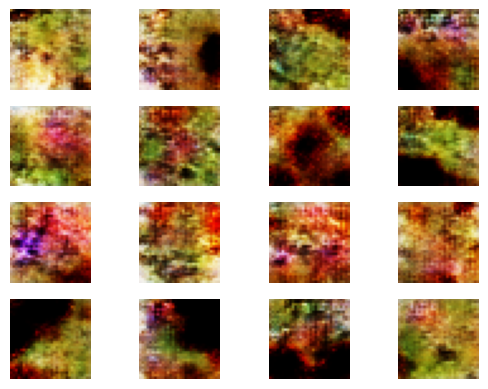

In [70]:
from keras.models import load_model
from numpy.random import randn
from matplotlib import pyplot as plt

def generate_latent_points(latent_dim, n_samples):
	x_input = randn(latent_dim * n_samples)
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input

def save_plot(examples, n):
	examples = examples*127 + 127
	examples = examples.astype("uint8")
	for i in range(n * n):
		plt.subplot(n, n, 1 + i)
		plt.axis('off')
		plt.imshow(examples[i])
	plt.show()

model = load_model(os.path.join(r'.\models', 'food\generator'))

latent_points = generate_latent_points(100, 16) 

X = model.predict(latent_points)

save_plot(X, 4)